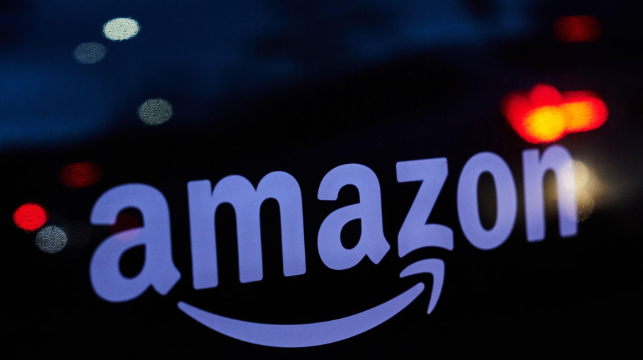

### Importing Libraries 

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

In [2]:
a = pd.read_csv("E:\\INTERNSHIP AT Innobyte Services\Amazon Sale Report.csv",encoding = 'latin-1')
a.shape

(128976, 21)

In [3]:
a.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 128976 entries, 0 to 128975
Data columns (total 21 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   index               128976 non-null  int64  
 1   Order ID            128976 non-null  object 
 2   Date                128976 non-null  object 
 3   Status              128976 non-null  object 
 4   Fulfilment          128976 non-null  object 
 5   Sales Channel       128976 non-null  object 
 6   ship-service-level  128976 non-null  object 
 7   Category            128976 non-null  object 
 8   Size                128976 non-null  object 
 9   Courier Status      128976 non-null  object 
 10  Qty                 128976 non-null  int64  
 11  currency            121176 non-null  object 
 12  Amount              121176 non-null  float64
 13  ship-city           128941 non-null  object 
 14  ship-state          128941 non-null  object 
 15  ship-postal-code    128941 non-nul

In [4]:
a.describe()

,index,Qty,Amount,ship-postal-code,New,PendingS
count,128976.000000,128976.000000,121176.000000,128941.000000,0.0,0.0
mean,64486.130427,0.904401,648.562176,463945.677744,NaN,NaN
std,37232.897832,0.313368,281.185041,191458.488954,NaN,NaN
min,0.000000,0.000000,0.000000,110001.000000,NaN,NaN
25%,32242.750000,1.000000,449.000000,382421.000000,NaN,NaN
50%,64486.500000,1.000000,605.000000,500033.000000,NaN,NaN
75%,96730.250000,1.000000,788.000000,600024.000000,NaN,NaN
max,128974.000000,15.000000,5584.000000,989898.000000,NaN,NaN


In [5]:
a.head()

,index,Order ID,Date,Status,Fulfilment,Sales Channel,ship-service-level,Category,Size,Courier Status,...,currency,Amount,ship-city,ship-state,ship-postal-code,ship-country,B2B,fulfilled-by,New,PendingS
0,0,405-8078784-5731545,04-30-22,Cancelled,Merchant,Amazon.in,Standard,T-shirt,S,On the Way,...,INR,647.62,MUMBAI,MAHARASHTRA,400081.0,IN,False,Easy Ship,NaN,NaN
1,1,171-9198151-1101146,04-30-22,Shipped - Delivered to Buyer,Merchant,Amazon.in,Standard,Shirt,3XL,Shipped,...,INR,406.00,BENGALURU,KARNATAKA,560085.0,IN,False,Easy Ship,NaN,NaN
2,2,404-0687676-7273146,04-30-22,Shipped,Amazon,Amazon.in,Expedited,Shirt,XL,Shipped,...,INR,329.00,NAVI MUMBAI,MAHARASHTRA,410210.0,IN,True,NaN,NaN,NaN
3,3,403-9615377-8133951,04-30-22,Cancelled,Merchant,Amazon.in,Standard,Blazzer,L,On the Way,...,INR,753.33,PUDUCHERRY,PUDUCHERRY,605008.0,IN,False,Easy Ship,NaN,NaN
4,4,407-1069790-7240320,04-30-22,Shipped,Amazon,Amazon.in,Expedited,Trousers,3XL,Shipped,...,INR,574.00,CHENNAI,TAMIL NADU,600073.0,IN,False,NaN,NaN,NaN


In [6]:
# dropping Columns with no data
a.drop(columns=["New","PendingS"] , inplace = True)

In [7]:
#Type casting
a['ship-postal-code'] = a['ship-postal-code'].astype('str')

#### Statistical Analysis 

In [8]:
import pandas as pd
import numpy as np
from scipy.stats import skew, kurtosis, mode

numerical_cols = a.select_dtypes(include=[np.number]).columns
stats = {}

for col in numerical_cols:
    stats[col] = {}
    stats[col]['mean'] = a[col].mean()
    stats[col]['median'] = a[col].median()
    stats[col]['mode'] = mode(a[col].dropna())[0][0] if not a[col].dropna().empty else np.nan
    stats[col]['variance'] = a[col].var()
    stats[col]['range'] = a[col].max() - a[col].min()
    stats[col]['skewness'] = skew(a[col].dropna())
    stats[col]['kurtosis'] = kurtosis(a[col].dropna())

stats_df = pd.DataFrame(stats)
print(stats_df)


                 index        Qty        Amount
mean      6.448613e+04   0.904401    648.562176
median    6.448650e+04   1.000000    605.000000
mode      6.000000e+00   1.000000    399.000000
variance  1.386289e+09   0.098199  79065.027373
range     1.289740e+05  15.000000   5584.000000
skewness -4.602848e-05  -0.698170      0.885954
kurtosis -1.199952e+00  60.348420      3.006352


C:\Users\ankit\AppData\Local\Temp\ipykernel_119132\2373773372.py:12: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  stats[col]['mode'] = mode(a[col].dropna())[0][0] if not a[col].dropna().empty else np.nan


### EDA 

In [9]:
a['Order ID'].nunique()

120229

In [10]:
a.Date = pd.to_datetime(a.Date)

In [11]:
print(a.Date.min())
print(a.Date.max())

2022-03-31 00:00:00
2022-06-29 00:00:00


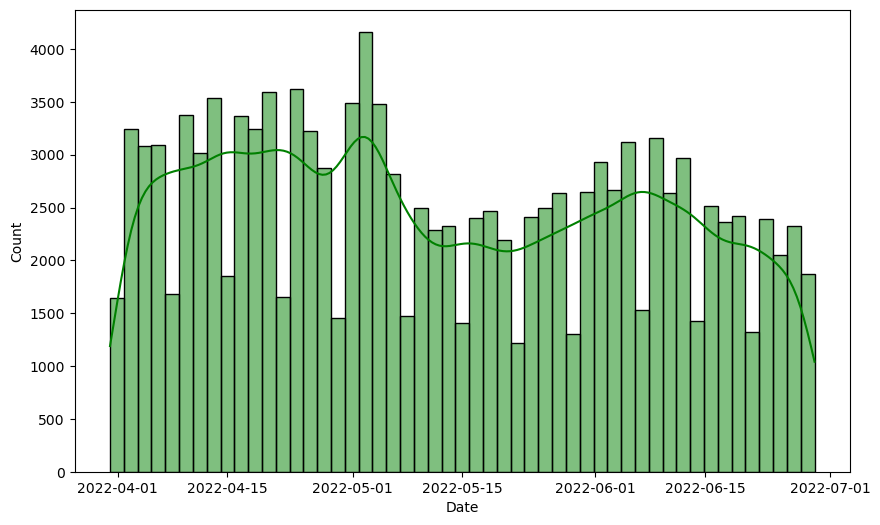

In [12]:
# Date Distribution
plt.figure(figsize = (10,6))
sns.histplot(a.Date,color='green',kde=True)
plt.show()

In [13]:
# Order status distribution
round((a.Status.value_counts()/len(a))*100,2)

Shipped                          60.33
Shipped - Delivered to Buyer     22.30
Cancelled                        14.22
Shipped - Returned to Seller      1.52
Shipped - Picked Up               0.75
Pending                           0.51
Pending - Waiting for Pick Up     0.22
Shipped - Returning to Seller     0.11
Shipped - Out for Delivery        0.03
Shipped - Rejected by Buyer       0.01
Shipping                          0.01
Shipped - Lost in Transit         0.00
Shipped - Damaged                 0.00
Name: Status, dtype: float64

In [14]:
round((a.Fulfilment.value_counts()/len(a))*100,2)

Amazon      69.56
Merchant    30.44
Name: Fulfilment, dtype: float64

In [15]:
round((a['Sales Channel'].value_counts()/len(a))*100,2)

Amazon.in     99.9
Non-Amazon     0.1
Name: Sales Channel, dtype: float64

In [16]:
import plotly.express as px

# The value counts for the 'ship-service-level' column
value_counts = a['ship-service-level'].value_counts()

fig = px.pie(
    values=value_counts.values, 
    names=value_counts.index, 
    title='Ship Service Level Distribution',
    color_discrete_sequence=px.colors.qualitative.Pastel1  # Set3 for a diverse color palette
)


fig.update_traces(textinfo='percent+label')
fig.show()


In [17]:
import plotly.express as px
fig = px.histogram(a, x='Amount', color_discrete_sequence=['blue'])  
fig.show()


In [18]:
# Total sales
total_sales = a['Amount'].sum()

# Average sales per order
average_sales_per_order = a['Amount'].mean()

# Sales trends over time 
sales_over_time = a.groupby(pd.to_datetime(a['Date']).dt.to_period('M'))['Amount'].sum()
sales_over_time

Date
2022-03      101683.85
2022-04    28836200.27
2022-05    26226476.75
2022-06    23425809.38
Freq: M, Name: Amount, dtype: float64

In [19]:
# Distribution of product categories
product_category_distribution = a['Category'].value_counts()

# Distribution of product sizes
product_size_distribution = a['Size'].value_counts()

# Top selling products
top_selling_products = a.groupby('Category')['Qty'].sum().nlargest(5)
top_selling_products

Category
T-shirt     45292
Shirt       45044
Blazzer     13943
Trousers     9898
Perfume      1051
Name: Qty, dtype: int64

In [20]:
import plotly.express as px

value_counts = a['Courier Status'].value_counts()

fig = px.pie(
    names=value_counts.index, 
    values=value_counts.values, 
    title='Courier Status Distribution',
    color_discrete_sequence=px.colors.qualitative.Set3  # Set3 is a diverse color set
)

# Add percentages in the labels
fig.update_traces(textinfo='percent+label')

# Show the figure
fig.show()


C:\Users\ankit\AppData\Local\Temp\ipykernel_119132\592649355.py:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




<Axes: xlabel='Qty', ylabel='Density'>

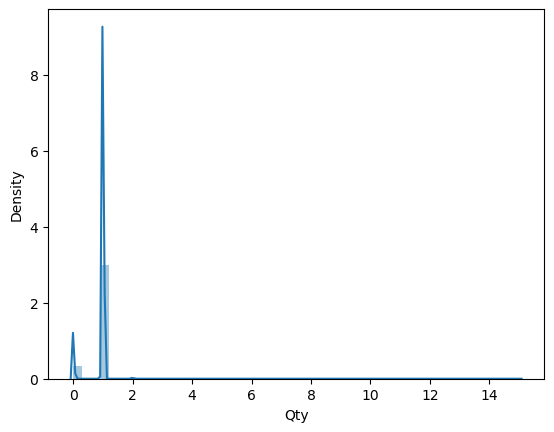

In [21]:
# Quantity Distribution
sns.distplot(a.Qty)

In [22]:
# Category wise Quantity
a.groupby('Category')['Qty'].sum()

Category
Blazzer     13943
Perfume      1051
Shirt       45044
Shoes         153
Socks         399
T-shirt     45292
Trousers     9898
Wallet        863
Watch           3
Name: Qty, dtype: int64

In [23]:
# Category wise revenue
a.groupby('Category')['Amount'].sum()

Category
Blazzer     11215104.12
Perfume       789419.66
Shirt       21297770.08
Shoes         124752.76
Socks         150757.50
T-shirt     39206756.65
Trousers     5346286.30
Wallet        458408.18
Watch            915.00
Name: Amount, dtype: float64

In [24]:
print('Count of City:',a['ship-city'].nunique())
print('Count of State:',a['ship-state'].nunique())
print('Count of postal:',a['ship-postal-code'].nunique())
print('Count of country:',a['ship-country'].nunique())

Count of City: 8948
Count of State: 69
Count of postal: 9455
Count of country: 1


In [25]:
import plotly.express as px
import pandas as pd


# Total sales over time
sales_over_time = a.groupby('Date')['Amount'].sum().reset_index()

fig = px.line(sales_over_time, x='Date', y='Amount', title='Total Sales Over Time',
              color_discrete_sequence=['#2f77b4'])  # Change color here
fig.update_layout(xaxis_title='Date', yaxis_title='Total Sales')
fig.show()

# Sales by Status
sales_by_status = a.groupby('Status')['Amount'].sum().reset_index()

fig = px.bar(sales_by_status, x='Status', y='Amount', title='Sales by Status',
             color_discrete_sequence=['#ff7f0e'])  # Change color here
fig.update_layout(xaxis_title='Status', yaxis_title='Total Sales')
fig.show()


In [26]:
# Order Status Analysis
order_status_counts = a['Status'].value_counts().reset_index()
order_status_counts.columns = ['Status', 'Count']

fig = px.bar(order_status_counts, x='Status', y='Count', title='Order Status Distribution', 
             labels={'Status': 'Order Status', 'Count': 'Number of Orders'},
             template='plotly_white')

fig.update_layout(xaxis_tickangle=-45)
fig.show()


In [27]:
import plotly.express as px
import pandas as pd

# Sales by Category
sales_by_category = a.groupby('Category')['Amount'].sum().reset_index()


fig = px.bar(sales_by_category, x='Category', y='Amount', title='Sales by Category',
             color='Category', color_discrete_sequence=px.colors.qualitative.Pastel1 ,template = 'plotly_dark')  # Example using Pastel1
fig.update_layout(xaxis_title='Category', yaxis_title='Total Sales')
fig.show()

# Quantities sold by Size
quantities_by_size = a.groupby('Size')['Qty'].sum().reset_index()

fig = px.bar(quantities_by_size, x='Size', y='Qty', title='Quantities Sold by Size',
             color='Size', color_discrete_sequence=px.colors.qualitative.Set3 , template = 'plotly_dark')  # Example using Set3
fig.update_layout(xaxis_title='Size', yaxis_title='Quantities Sold')
fig.show()

In [28]:
import plotly.express as px
import pandas as pd

# Orders by Fulfillment Method
fulfillment_counts = a['Fulfilment'].value_counts().reset_index()
fulfillment_counts.columns = ['Fulfilment', 'Order Count']

fig = px.bar(fulfillment_counts, x='Fulfilment', y='Order Count', title='Orders by Fulfillment Method',
             color_discrete_sequence=['#1f77b4'])  # Change color here
fig.update_layout(xaxis_title='Fulfillment Method', yaxis_title='Order Count')
fig.show()

# Sales by Fulfillment Method
sales_by_fulfillment = a.groupby('Fulfilment')['Amount'].sum().reset_index()

fig = px.bar(sales_by_fulfillment, x='Fulfilment', y='Amount', title='Sales by Fulfillment Method',
             color_discrete_sequence=['#ff7f0e'])  # Change color here
fig.update_layout(xaxis_title='Fulfillment Method', yaxis_title='Total Sales')
fig.show()


In [29]:
import plotly.express as px
import pandas as pd

# segmentation by sales channel and country
segmentation = a.groupby(['Sales Channel', 'ship-country'])['Amount'].sum().reset_index()

fig = px.bar(segmentation, x='Sales Channel', y='Amount', color='ship-country', 
             title='Sales by Sales Channel and Country',
             color_discrete_sequence=px.colors.qualitative.Set2)  # Change color sequence here
fig.update_layout(xaxis_title='Sales Channel', yaxis_title='Total Sales')
fig.show()


In [30]:
import plotly.express as px

# Sales by State
sales_by_state = a.groupby('ship-state')['Amount'].sum().reset_index().sort_values(by='Amount', ascending=False)

fig = px.bar(sales_by_state, x='ship-state', y='Amount', title='Sales by State',
             color='Amount',  # Use 'Amount' to apply a heatmap-like color scale
             color_continuous_scale='Viridis')  # Change color scale here
fig.update_layout(xaxis_title='State', yaxis_title='Total Sales', 
                  xaxis={'categoryorder':'total descending','tickangle': -45})
fig.show()

# Sales by City
top_cities = a.groupby('ship-city')['Amount'].sum().reset_index().sort_values(by='Amount', ascending=False).head(20)

fig = px.bar(top_cities, x='ship-city', y='Amount', title='Top 20 Cities by Sales',
             color='Amount',  # Use 'Amount' to apply a heatmap-like color scale
             color_continuous_scale='Inferno')  # Change color scale here
fig.update_layout(xaxis_title='City', yaxis_title='Total Sales', 
                  xaxis={'categoryorder':'total descending','tickangle': -45})
fig.show()



In [31]:
col1 = "Amount"
col2 = "Qty"
color_column = "Category"  

fig = px.scatter(a, x=col1, y=col2, color=color_column,
                 title=f"Scatter Plot: {col1} vs. {col2} with Different Colors",
                 labels={col1: col1, col2: col2, color_column: "Category"})

# Show the plot
fig.show()


In [32]:
# Customer Segmentation
state_sales = a.groupby('ship-state')['Amount'].sum().reset_index()
state_sales.columns = ['State', 'Total Sales']


fig = px.bar(state_sales, x='State', y='Total Sales', title='Sales by State',
             labels={'State': 'Ship State', 'Total Sales': 'Total Sales Amount'},
             color='Total Sales',  
             template='plotly_white')

fig.update_layout(xaxis_tickangle=-45)
fig.show()

In [33]:
import pandas as pd
import plotly.graph_objects as go

#
corr_matrix = a.corr()

columns = corr_matrix.columns
index = corr_matrix.index

# heatmap
fig = go.Figure(data=go.Heatmap(
    z=corr_matrix.values,
    x=columns,
    y=index,
    colorscale='RdBu',  # You can change the colorscale as desired
    colorbar=dict(title='Correlation'),
))


for i, row in enumerate(index):
    for j, col in enumerate(columns):
        fig.add_annotation(
            x=col,
            y=row,
            text=str(round(corr_matrix.values[i, j], 2)),
            showarrow=False,
            font=dict(color="white")  # Set text color to white
        )

        
fig.update_layout(
    title="Correlation Heatmap",
    xaxis_title="Features",
    yaxis_title="Features",
    xaxis=dict(ticks="outside", ticklen=10),  # Increase tick length
    yaxis=dict(ticks="outside", ticklen=10)   # Increase tick length
)


fig.show()


C:\Users\ankit\AppData\Local\Temp\ipykernel_119132\3524969810.py:5: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



###  Data Preprocessing

In [34]:
#null value %
(a.isnull().sum()/len(a))*100

index                  0.000000
Order ID               0.000000
Date                   0.000000
Status                 0.000000
Fulfilment             0.000000
Sales Channel          0.000000
ship-service-level     0.000000
Category               0.000000
Size                   0.000000
Courier Status         0.000000
Qty                    0.000000
currency               6.047637
Amount                 6.047637
ship-city              0.027137
ship-state             0.027137
ship-postal-code       0.000000
ship-country           0.027137
B2B                    0.000000
fulfilled-by          69.557902
dtype: float64

In [35]:
# Handling Null values
a['currency'].fillna(a.currency.mode()[0], inplace = True)
a['Amount'].fillna(a.Amount.mean(), inplace = True)
a['ship-city'].fillna(a['ship-city'].mode()[0], inplace = True)               
a['ship-state'].fillna(a['ship-state'].mode()[0], inplace = True)              
a['ship-postal-code'].fillna(a['ship-postal-code'].mode()[0], inplace = True)        
a['ship-country'].fillna(a['ship-country'].mode()[0], inplace = True)            

In [36]:
a.drop(columns=["fulfilled-by"],inplace=True)
a.drop(columns=['index'],inplace=True)

In [37]:
(a.isnull().sum()/len(a))*100

Order ID              0.0
Date                  0.0
Status                0.0
Fulfilment            0.0
Sales Channel         0.0
ship-service-level    0.0
Category              0.0
Size                  0.0
Courier Status        0.0
Qty                   0.0
currency              0.0
Amount                0.0
ship-city             0.0
ship-state            0.0
ship-postal-code      0.0
ship-country          0.0
B2B                   0.0
dtype: float64

### Outliers

In [38]:
import plotly.graph_objects as go
fig = go.Figure()


fig.add_trace(go.Box(y=a['Amount'], marker_color='green'))

# Update box plot layout
fig.update_layout(
    title="Box Plot of Amount",
    yaxis_title="Amount"
)

# Show the plot
fig.show()


In [39]:
import plotly.graph_objects as go
fig = go.Figure()
fig.add_trace(go.Box(y=a['Qty'], marker_color='Blue'))

# Update box plot layout
fig.update_layout(
    title="Box Plot of Quantity",
    yaxis_title="Quantity"
)

# Show the plot
fig.show()
